In [1]:
import json
import numpy as np
import glob
import os
from PIL import Image
import matplotlib.pyplot as plt
import cv2
import pandas as pd
from matplotlib.colors import ListedColormap
from matplotlib import rc
import random

In [2]:
# matplotlib 한글 폰트 깨짐 문제 해결
import matplotlib.font_manager as fm
font_path = '/usr/share/fonts/opentype/noto/NotoSansCJK-Regular.ttc'
fontprop = fm.FontProperties(fname=font_path)

#### 파일 업로드

In [3]:
# 경로 설정

data_path = '/workspace/#Ub370#Uc774#Ud130/Data'

train_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/train/'
val_img_path = '/workspace/#Ub370#Uc774#Ud130/Data/img/val/'

train_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/train/'
val_json_path = '/workspace/#Ub370#Uc774#Ud130/Data/label/val/'


train_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/train/'
val_segment_path = '/workspace/#Ub370#Uc774#Ud130/Data/segmentation/val/'

In [4]:
# 라벨 정보 json 파일
# json_anger, json_happy, json_panic, json_sadness

with open (train_json_path + "train_anger.json", "r", encoding='euc-kr') as f:
    json_anger = json.load(f)

with open (train_json_path + "train_happy.json", "r", encoding='euc-kr') as f:
    json_happy = json.load(f)

with open (train_json_path + "train_panic.json", "r", encoding='euc-kr') as f:
    json_panic = json.load(f)

with open (train_json_path + "train_sadness.json", "r", encoding='euc-kr') as f:
    json_sadness = json.load(f)

In [9]:
# Segmentation 정보 npz 파일
# npz_anger, npz_happy, npz_panic, npz_sadness

npz_anger = np.load(train_segment_path + 'train_anger.npz')
npz_happy = np.load(train_segment_path + 'train_happy.npz')
npz_panic = np.load(train_segment_path + 'train_panic.npz')
npz_sadness = np.load(train_segment_path + 'train_sadness.npz')

### JSON 파일

In [5]:
json_happy[0]

{'filename': '1ssf46b4695747c6e323bf090389b57049cff58a0851d50d3de8c0dc5ccb7lemg.jpg',
 'gender': '남',
 'age': 50,
 'isProf': '일반인',
 'faceExp_uploader': '기쁨',
 'bg_uploader': '실외 자연환경',
 'annot_A': {'boxes': {'maxX': 2080.465,
   'maxY': 1655.1898000000003,
   'minX': 1383.6719000000003,
   'minY': 719.3847},
  'faceExp': '기쁨',
  'bg': '실외 자연환경'},
 'annot_B': {'boxes': {'maxX': 2080.4649999999997,
   'maxY': 1722.081477143965,
   'minX': 1383.6719000000003,
   'minY': 815.2268358056745},
  'faceExp': '기쁨',
  'bg': '실외 자연환경'},
 'annot_C': {'boxes': {'maxX': 2080.465,
   'maxY': 1655.1898000000003,
   'minX': 1383.6719,
   'minY': 719.3847000000001},
  'faceExp': '기쁨',
  'bg': '실외 자연환경'}}

In [6]:
# Json 파일 -> DataFrame 변환
# df_train_anger, df_train_happy, df_train_panic, df_train_sadness

# 데이터 변환 함수 정의
def process_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # annot_A, annot_B, annot_C 데이터 추가
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            row = {
                **base_info,
                'annot': annot_key,
                'faceExp': annot.get('faceExp'),
                'bg': annot.get('bg'),
                'minX': annot.get('boxes', {}).get('minX'),
                'minY': annot.get('boxes', {}).get('minY'),
                'maxX': annot.get('boxes', {}).get('maxX'),
                'maxY': annot.get('boxes', {}).get('maxY'),
            }
            processed_data.append(row)
    return pd.DataFrame(processed_data)

# 데이터프레임 생성
df_train_anger = process_data(json_anger)
df_train_happy = process_data(json_happy)
df_train_panic = process_data(json_panic)
df_train_sadness = process_data(json_sadness)


##### 이미지와 json 파일 내 filename이 일치하는 지 확인

In [7]:
happy_img_path = train_img_path + 'happy'

IMAGE_EXTENSIONS = {'.jpg', '.jpeg', '.png', '.bmp', '.gif', '.tiff', '.webp'}

# 폴더 내 이미지 파일 개수 세기
def count_images_in_folder(folder_path):
    image_count = 0
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_count += 1
    return image_count

image_count = count_images_in_folder(happy_img_path)
print(f"폴더 내 이미지 파일 개수: {image_count}")
print(f"json 파일 길이 : {len(json_happy)}")

폴더 내 이미지 파일 개수: 1494
json 파일 길이 : 1494


In [8]:
# 폴더 내 이미지 파일 이름 수집
def get_image_files_in_folder(folder_path):
    image_files = set()
    for root, dirs, files in os.walk(folder_path):
        for file in files:
            if os.path.splitext(file)[1].lower() in IMAGE_EXTENSIONS:
                image_files.add(file)
    return image_files

# JSON 파일 내 이미지 파일 이름 수집
def get_image_files_in_json(json_file):
    json_filenames = {entry["filename"] for entry in json_file}
    return json_filenames

# 비교 수행
image_files_in_folder = get_image_files_in_folder(happy_img_path)
image_files_in_json = get_image_files_in_json(json_happy)

# 누락된 파일 찾기
missing_in_json = image_files_in_folder - image_files_in_json
missing_in_folder = image_files_in_json - image_files_in_folder

# 결과 출력
print(f"JSON 파일에 없는 폴더 내 이미지 파일: {missing_in_json}")
print(f"폴더에 없는 JSON 파일의 이미지 파일: {missing_in_folder}")

JSON 파일에 없는 폴더 내 이미지 파일: set()
폴더에 없는 JSON 파일의 이미지 파일: set()


#### Train Happy

In [9]:
df_train_happy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4482 entries, 0 to 4481
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          4482 non-null   object 
 1   gender            4482 non-null   object 
 2   age               4482 non-null   int64  
 3   isProf            4482 non-null   object 
 4   faceExp_uploader  4482 non-null   object 
 5   bg_uploader       4482 non-null   object 
 6   annot             4482 non-null   object 
 7   faceExp           4482 non-null   object 
 8   bg                4482 non-null   object 
 9   minX              4482 non-null   float64
 10  minY              4482 non-null   float64
 11  maxX              4482 non-null   float64
 12  maxY              4482 non-null   float64
dtypes: float64(4), int64(1), object(8)
memory usage: 455.3+ KB


In [10]:
df_train_happy

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,1ssf46b4695747c6e323bf090389b57049cff58a0851d5...,남,50,일반인,기쁨,실외 자연환경,annot_A,기쁨,실외 자연환경,1383.671900,719.384700,2080.465000,1655.189800
1,1ssf46b4695747c6e323bf090389b57049cff58a0851d5...,남,50,일반인,기쁨,실외 자연환경,annot_B,기쁨,실외 자연환경,1383.671900,815.226836,2080.465000,1722.081477
2,1ssf46b4695747c6e323bf090389b57049cff58a0851d5...,남,50,일반인,기쁨,실외 자연환경,annot_C,기쁨,실외 자연환경,1383.671900,719.384700,2080.465000,1655.189800
3,hfbl2d0622517ad6ef5456d1fa4e7d52f57ff1dff32094...,남,20,일반인,기쁨,실외 자연환경,annot_A,기쁨,실외 자연환경,471.411790,277.346133,937.669830,822.907783
4,hfbl2d0622517ad6ef5456d1fa4e7d52f57ff1dff32094...,남,20,일반인,기쁨,실외 자연환경,annot_B,기쁨,실외 자연환경,471.302790,279.082133,937.193830,820.576784
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4477,1phx02e992fdd73001058998f3d484c1704dbe85fb90fd...,여,30,일반인,기쁨,공공시설/종교/의료시설,annot_B,기쁨,행사/사무공간,1099.539300,245.963940,1968.247800,1559.891800
4478,1phx02e992fdd73001058998f3d484c1704dbe85fb90fd...,여,30,일반인,기쁨,공공시설/종교/의료시설,annot_C,기쁨,공공시설/종교/의료,1099.539300,245.963940,1968.247800,1559.891800
4479,5mdb318428418e8833f81934a8a9330f738f7fff5f3e44...,여,20,일반인,기쁨,공공시설/종교/의료시설,annot_A,기쁨,문화재 및 유적지,493.818232,399.713922,1159.041976,1330.000000
4480,5mdb318428418e8833f81934a8a9330f738f7fff5f3e44...,여,20,일반인,기쁨,공공시설/종교/의료시설,annot_B,기쁨,문화재 및 유적지,484.208680,376.974800,1168.990200,1308.912700


##### 표정 데이터 확인
- faceExp_uploader (image) 와 faceExp (annot) 차이 확인
- 표정 정보가 다른 이미지들 어떻게 처리할지

In [11]:
df_train_happy['faceExp_uploader'].value_counts()

faceExp_uploader
기쁨    4482
Name: count, dtype: int64

In [12]:
df_train_happy['faceExp'].value_counts()

faceExp
기쁨    4359
중립      51
당황      26
슬픔      16
불안      14
분노       8
상처       8
Name: count, dtype: int64

In [13]:
# faceExp가 기쁨이 아닌 데이터 추출
def process_non_happy_data(data):
    processed_data = []
    for item in data:
        base_info = {
            'filename': item.get('filename'),
            'gender': item.get('gender'),
            'age': item.get('age'),
            'isProf': item.get('isProf'),
            'faceExp_uploader': item.get('faceExp_uploader'),
            'bg_uploader': item.get('bg_uploader'),
        }

        # Process each annotation and filter for non-happy faceExp
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            annot = item.get(annot_key, {})
            face_exp = annot.get('faceExp')
            if face_exp != "기쁨":  # Only include non-happy faceExp
                row = {
                    **base_info,
                    'annot': annot_key,
                    'faceExp': face_exp,
                    'bg': annot.get('bg'),
                    'minX': annot.get('boxes', {}).get('minX'),
                    'minY': annot.get('boxes', {}).get('minY'),
                    'maxX': annot.get('boxes', {}).get('maxX'),
                    'maxY': annot.get('boxes', {}).get('maxY'),
                }
                processed_data.append(row)
    return pd.DataFrame(processed_data)

df_train_not_happy = process_non_happy_data(json_happy)

    

In [14]:
df_train_not_happy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123 entries, 0 to 122
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   filename          123 non-null    object 
 1   gender            123 non-null    object 
 2   age               123 non-null    int64  
 3   isProf            123 non-null    object 
 4   faceExp_uploader  123 non-null    object 
 5   bg_uploader       123 non-null    object 
 6   annot             123 non-null    object 
 7   faceExp           123 non-null    object 
 8   bg                123 non-null    object 
 9   minX              123 non-null    float64
 10  minY              123 non-null    float64
 11  maxX              123 non-null    float64
 12  maxY              123 non-null    float64
dtypes: float64(4), int64(1), object(8)
memory usage: 12.6+ KB


In [15]:
df_train_not_happy

,filename,gender,age,isProf,faceExp_uploader,bg_uploader,annot,faceExp,bg,minX,minY,maxX,maxY
0,1xvo29f24267fc0d2fa7c194983e124284f92860226356...,남,30,전문인,기쁨,오락/공연시설,annot_A,당황,스포츠 관람 및 레저시설,894.132900,373.212220,1509.734400,1137.536100
1,gfogd47a7255637552b1f3d662459579f1e947076af25f...,남,30,전문인,기쁨,상업시설/점포/시장,annot_A,당황,상업시설/점포/시장,935.071200,351.817720,1531.981000,1105.139500
2,gfogd47a7255637552b1f3d662459579f1e947076af25f...,남,30,전문인,기쁨,상업시설/점포/시장,annot_B,분노,상업시설/점포/시장,969.943359,385.762500,1547.068359,1157.287500
3,gfogd47a7255637552b1f3d662459579f1e947076af25f...,남,30,전문인,기쁨,상업시설/점포/시장,annot_C,분노,상업시설/점포/시장,962.891854,352.012579,1547.233881,1163.269507
4,lfc5dd549ddbf0dbc4f9b355d18d6d8891014f05461c83...,여,30,전문인,기쁨,오락/공연시설,annot_C,당황,오락/공연시설,1304.680581,505.892932,2118.496018,1702.316670
...,...,...,...,...,...,...,...,...,...,...,...,...,...
118,tmbffd123c3be763456d99ceaee4977368792faeede15b...,남,40,전문인,기쁨,실외 자연환경,annot_A,중립,도심 환경,2009.433311,429.882765,2719.842397,1358.109789
119,v2we3fff9a7f33247f2776207316fb341361c20614bfc4...,남,30,전문인,기쁨,문화재 및 유적지,annot_C,슬픔,행사/사무공간,1383.338986,623.688673,2221.617314,1766.379727
120,h7cyaa86fbb4478d50655603153b4848dffb76de6ee5cd...,남,30,전문인,기쁨,문화재 및 유적지,annot_C,슬픔,문화재 및 유적지,805.714694,391.559812,1824.502733,1769.298568
121,20xc60c31f781cf307c08c5cf13ddffa202d2e31ff1cdd...,여,30,전문인,기쁨,숙박 및 거주공간,annot_A,당황,숙박 및 거주공간,1062.245592,378.545225,1948.795990,1608.265477


In [16]:
df_train_not_happy['faceExp'].value_counts()

faceExp
중립    51
당황    26
슬픔    16
불안    14
분노     8
상처     8
Name: count, dtype: int64

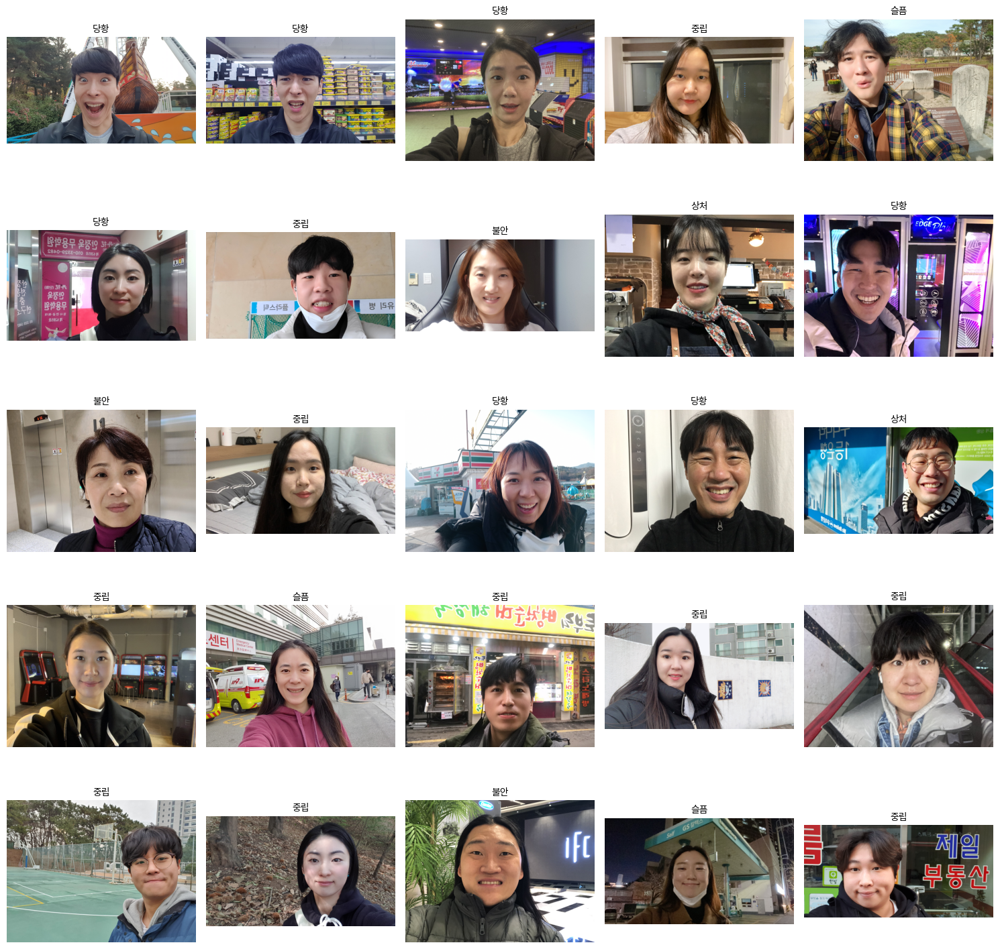

In [18]:
# 감정 정보가 다른 이미지 시각화
unique_filenames = df_train_not_happy['filename'].unique()

plt.figure(figsize=(15, 15))

for i, filename in enumerate(unique_filenames):
    if i >= 25:  # Show only the first 25 images for this example
        break
    image_path = os.path.join(train_img_path, 'happy', filename)
    if os.path.exists(image_path):  # Ensure the file exists
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        plt.subplot(5, 5, i + 1)
        plt.imshow(image)
        faceExp = df_train_not_happy[df_train_not_happy['filename'] == filename]['faceExp'].iloc[0]
        plt.title(faceExp, fontproperties=fontprop)
        plt.axis('off')

plt.tight_layout()
plt.show()

##### 연령, 성별, 전문인 column 분포 확인

In [19]:
# 연령 분포 확인
df_train_happy['age'].value_counts()

age
20    2247
30    1551
40     450
50     162
10      72
Name: count, dtype: int64

In [20]:
# 성별 분포 확인
df_train_happy['gender'].value_counts()

gender
여    2430
남    2052
Name: count, dtype: int64

In [21]:
# 전문인 여부
df_train_happy['isProf'].value_counts()

isProf
일반인    2481
전문인    2001
Name: count, dtype: int64

##### 배경 정보 확인
- bg_uploader와 bg 차이 확인
- 배경 정보가 다른 이미지들 어떻게 처리할지

In [22]:
# 배경 정보
df_train_happy['bg_uploader'].value_counts(), df_train_happy['bg'].value_counts()

(bg_uploader
 숙박 및 거주공간            873
 상업시설/점포/시장           693
 공공시설/종교/의료시설         591
 실외 자연환경              498
 교통/이동수단(엘리베이터 포함)    495
 도심 환경                474
 문화재 및 유적지            267
 행사/사무공간              222
 스포츠 관람 및 레저시설        186
 오락/공연시설              183
 Name: count, dtype: int64,
 bg
 숙박 및 거주공간            880
 상업시설/점포/시장           750
 공공시설/종교/의료           665
 도심 환경                538
 실외 자연환경              479
 교통/이동수단(엘리베이터 포함)    417
 행사/사무공간              279
 스포츠 관람 및 레저시설        148
 오락/공연시설              145
 문화재 및 유적지            139
 공공시설/종교/의료시설          42
 Name: count, dtype: int64)

##### 박스 좌표 정보 확인
- 한 이미지 내 박스 좌표가 유사한지 시각화 및 좌표 수치 확인

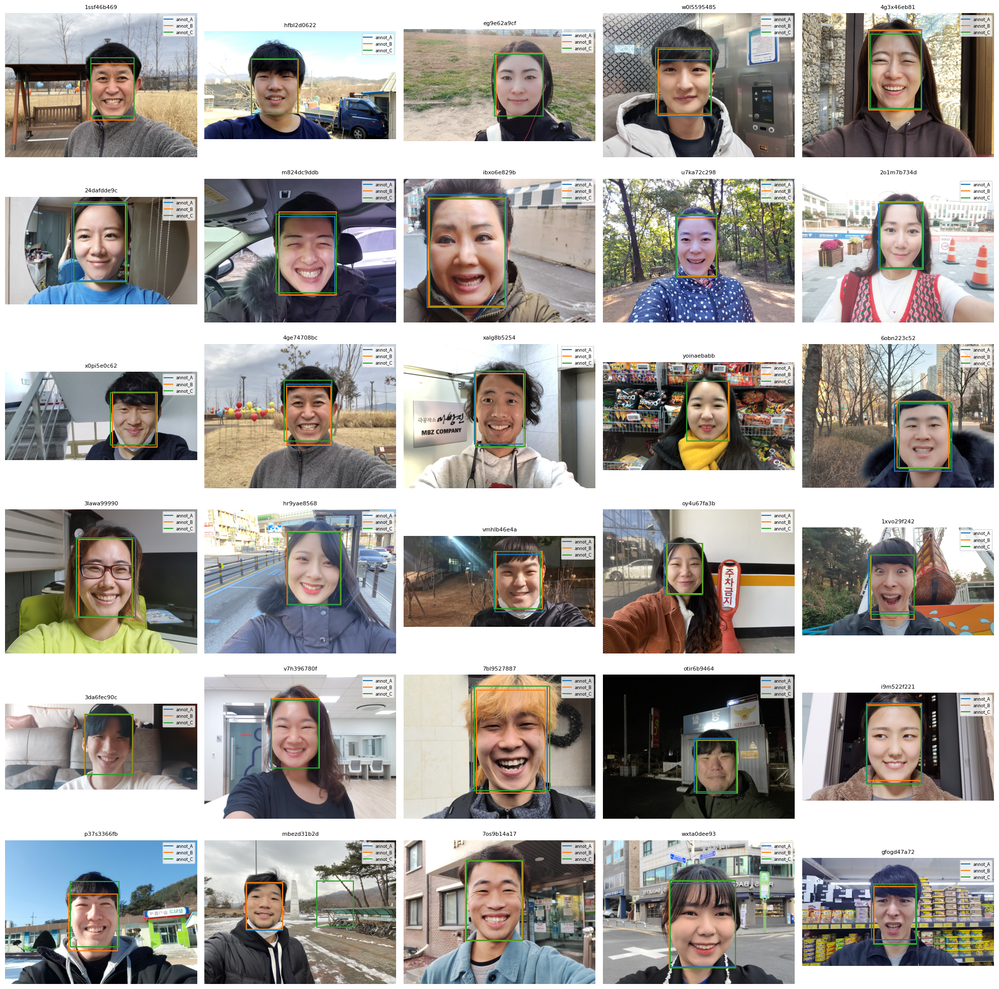

In [23]:
# 이미지 & 박스 시각화

def visualize_boxes(data, image_dir):
    data = data[:30]  # 30개 이미지만 시각화
    fig, axes = plt.subplots(6, 5, figsize=(20, 20))
    axes = axes.ravel()

    for idx, item in enumerate(data):
        filename = item['filename']
        image_path = os.path.join(image_dir, filename)

        if not os.path.exists(image_path):
            print(f"Image {filename} not found in directory {image_dir}.")
            continue

        # Load image
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        axes[idx].imshow(image) 
        axes[idx].axis('off')

        # Plot boxes from annotations
        for annot_key in ['annot_A', 'annot_B', 'annot_C']:
            if annot_key in item:
                box = item[annot_key]['boxes']
                x = [box['minX'], box['maxX'], box['maxX'], box['minX'], box['minX']]
                y = [box['minY'], box['minY'], box['maxY'], box['maxY'], box['minY']]
                axes[idx].plot(x, y, label=annot_key)

        axes[idx].set_title(filename[:10], fontsize=8)
        axes[idx].legend(fontsize=6)
       
    # Hide unused subplots
    for i in range(len(data), 30):
        axes[i].axis('off')

    plt.tight_layout()
    plt.show()

visualize_boxes(json_happy, happy_img_path)

In [24]:
# 박스 좌표 수치 확인

# 임의로 10개의 파일 이름 선택
sample_filenames = df_train_happy['filename'].drop_duplicates().sample(n=10)

# 선택된 파일 이름에 대한 그룹 생성
sample_groups = df_train_happy[df_train_happy['filename'].isin(sample_filenames)]

# 같은 파일 이름끼리 그룹화
grouped = sample_groups.groupby('filename')

# 그룹 내 좌표 출력
for filename, group in grouped:
    print(f"Filename: {filename}")
    
    # 그룹 내 각 annot의 좌표 정보 출력
    for idx, row in group.iterrows():
        annot = row['annot']
        min_x, min_y, max_x, max_y = row['minX'], row['minY'], row['maxX'], row['maxY']
        print(f"  Annot: {annot}")
        print(f"    MinX: {min_x}, MinY: {min_y}")
        print(f"    MaxX: {max_x}, MaxY: {max_y}")
    
    print("-" * 30)

Filename: 69ou2b67fc9309721c772a776b2c4a3a1b74c67c0b42587d7567281280f7e8al0.jpg
  Annot: annot_A
    MinX: 597.6298000000002, MinY: 446.11157
    MaxX: 1709.8866999999998, MaxY: 2007.5911
  Annot: annot_B
    MinX: 650.4696383504322, MinY: 501.88828521483913
    MaxX: 1679.3833040676661, MaxY: 2010.4792329816203
  Annot: annot_C
    MinX: 597.6298, MinY: 446.11157
    MaxX: 1709.8866999999996, MaxY: 2007.5911
------------------------------
Filename: 9ludfa018997406f5af60670580a556b8ada0ded226446d13404a0a08f70dbn55.jpg
  Annot: annot_A
    MinX: 563.45447, MinY: 203.45892000000006
    MaxX: 1024.3094, MaxY: 818.7238
  Annot: annot_B
    MinX: 559.1054619983239, MinY: 220.82823108703454
    MaxX: 1017.0851217746815, MaxY: 836.0931110870345
  Annot: annot_C
    MinX: 563.4544699999999, MinY: 203.45892
    MaxX: 1024.3094, MaxY: 818.7237999999998
------------------------------
Filename: g7hm7356d666c6641fbfcf0803d07a6a109f9bbcbc7dd30ef914761c967c6a4ae.jpg
  Annot: annot_A
    MinX: 1230.71